In [1]:
import requests
import pandas as pd
import sys, json
import json
import string
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

url="https://archive.org/advancedsearch.php?q=funny+cat+videos&output=json&rows=500000"

In [2]:
response = requests.get(url).json()

In [3]:
response

{'responseHeader': {'status': 0,
  'QTime': 191,
  'params': {'query': '( (title:funny^100 OR salients:funny^50 OR subject:funny^25 OR description:funny^15 OR collection:funny^10 OR language:funny^10 OR text:funny^1) (title:cat^100 OR salients:cat^50 OR subject:cat^25 OR description:cat^15 OR collection:cat^10 OR language:cat^10 OR text:cat^1) (title:videos^100 OR salients:videos^50 OR subject:videos^25 OR description:videos^15 OR collection:videos^10 OR language:videos^10 OR text:videos^1) )',
   'qin': 'funny cat videos',
   'fields': '_default_',
   'wt': 'json',
   'rows': '500000',
   'start': 0}},
 'response': {'numFound': 341,
  'start': 0,
  'docs': [{'backup_location': 'ia906705_7',
    'collection': ['podcast_hilahs-happy-hour_1198327299', 'podcasts'],
    'creator': 'Hilah Johnson, Award-winning YouTuber interviewing interesting, funny people about food, culture, life and drinking',
    'date': '2017-03-21T00:00:00Z',
    'description': 'In this episode of Hilah\'s Happy Hou

In [4]:
response['response']['docs'][1]['publicdate']

'2020-12-27T18:35:27Z'

In [5]:
dates = [""]*9999
for count,row in enumerate(response['response']['docs']):
    try:
        dates[count]=row['publicdate']
    except:
        try:
            dates[count]=row['date']
        except:
            pass


In [6]:
dates

['2018-05-17T08:07:41Z',
 '2020-12-27T18:35:27Z',
 '2019-09-18T12:18:39Z',
 '2016-08-20T18:08:18Z',
 '2014-09-10T22:24:15Z',
 '2016-07-27T13:19:26Z',
 '2018-02-08T05:48:23Z',
 '2020-08-14T23:52:41Z',
 '2016-11-11T12:15:48Z',
 '2016-11-11T11:51:58Z',
 '2016-08-08T17:40:10Z',
 '2020-05-01T13:22:15Z',
 '2016-11-12T12:03:46Z',
 '2016-11-12T10:37:55Z',
 '2016-11-12T11:41:40Z',
 '2017-01-18T01:27:25Z',
 '2016-11-10T05:24:50Z',
 '2016-08-04T18:40:43Z',
 '2016-08-04T11:09:22Z',
 '2016-08-08T15:52:17Z',
 '2016-11-10T21:49:11Z',
 '2016-11-14T04:08:54Z',
 '2016-08-03T23:03:25Z',
 '2016-08-05T15:28:25Z',
 '2021-08-15T04:30:23Z',
 '2016-08-04T20:58:13Z',
 '2016-08-01T03:50:16Z',
 '2016-08-04T18:32:05Z',
 '2019-04-20T09:35:04Z',
 '2020-02-21T15:33:23Z',
 '2011-09-19T22:06:02Z',
 '2019-09-04T12:29:10Z',
 '2017-06-10T05:53:18Z',
 '2018-03-15T02:54:04Z',
 '2018-02-27T10:34:32Z',
 '2016-08-02T04:45:57Z',
 '2016-11-11T13:38:21Z',
 '2021-02-12T04:33:15Z',
 '2014-09-01T06:13:58Z',
 '2016-07-27T13:47:50Z',


In [7]:
dates = [x for x in dates if x]

In [8]:
dates = [x for x in dates if str(dates[0]) != "0"]

In [9]:
dates

['2018-05-17T08:07:41Z',
 '2020-12-27T18:35:27Z',
 '2019-09-18T12:18:39Z',
 '2016-08-20T18:08:18Z',
 '2014-09-10T22:24:15Z',
 '2016-07-27T13:19:26Z',
 '2018-02-08T05:48:23Z',
 '2020-08-14T23:52:41Z',
 '2016-11-11T12:15:48Z',
 '2016-11-11T11:51:58Z',
 '2016-08-08T17:40:10Z',
 '2020-05-01T13:22:15Z',
 '2016-11-12T12:03:46Z',
 '2016-11-12T10:37:55Z',
 '2016-11-12T11:41:40Z',
 '2017-01-18T01:27:25Z',
 '2016-11-10T05:24:50Z',
 '2016-08-04T18:40:43Z',
 '2016-08-04T11:09:22Z',
 '2016-08-08T15:52:17Z',
 '2016-11-10T21:49:11Z',
 '2016-11-14T04:08:54Z',
 '2016-08-03T23:03:25Z',
 '2016-08-05T15:28:25Z',
 '2021-08-15T04:30:23Z',
 '2016-08-04T20:58:13Z',
 '2016-08-01T03:50:16Z',
 '2016-08-04T18:32:05Z',
 '2019-04-20T09:35:04Z',
 '2020-02-21T15:33:23Z',
 '2011-09-19T22:06:02Z',
 '2019-09-04T12:29:10Z',
 '2017-06-10T05:53:18Z',
 '2018-03-15T02:54:04Z',
 '2018-02-27T10:34:32Z',
 '2016-08-02T04:45:57Z',
 '2016-11-11T13:38:21Z',
 '2021-02-12T04:33:15Z',
 '2014-09-01T06:13:58Z',
 '2016-07-27T13:47:50Z',


In [10]:
lastdates=len(dates)
newdates=0
while (newdates != lastdates):
    lastdates=newdates
    for i,row in enumerate(dates):    
        if dates[i][:4] < '2018':
            del dates[i]
            newdates=len(dates)

In [11]:
len(dates)

167

In [12]:
min(dates)

'2018-02-08T05:48:23Z'

In [13]:
max(dates)

'2021-09-29T03:56:51Z'

In [14]:
df = pd.DataFrame(dates)
#df = df.value_counts().sort_index()

In [15]:
df[0] = pd.to_datetime(df[0], dayfirst=True)

df1 = df[0].dt.date.value_counts().sort_index().reset_index()

df1.columns = ['DATE','Count']

In [16]:
df1['DATE'] = pd.to_datetime(df1['DATE'])

In [17]:
df1.set_index('DATE', inplace=True)

In [18]:
df1

,Count
DATE,
2018-02-08,1
2018-02-27,2
2018-03-15,1
2018-03-16,1
2018-03-25,1
...,...
2021-08-28,6
2021-09-01,1
2021-09-15,1


In [19]:
print (df1.index)

DatetimeIndex(['2018-02-08', '2018-02-27', '2018-03-15', '2018-03-16',
               '2018-03-25', '2018-03-27', '2018-04-03', '2018-04-23',
               '2018-05-17', '2018-05-22',
               ...
               '2021-07-23', '2021-08-05', '2021-08-15', '2021-08-18',
               '2021-08-23', '2021-08-28', '2021-09-01', '2021-09-15',
               '2021-09-25', '2021-09-29'],
              dtype='datetime64[ns]', name='DATE', length=129, freq=None)


0.001632379248658319x+1.1901013714967201


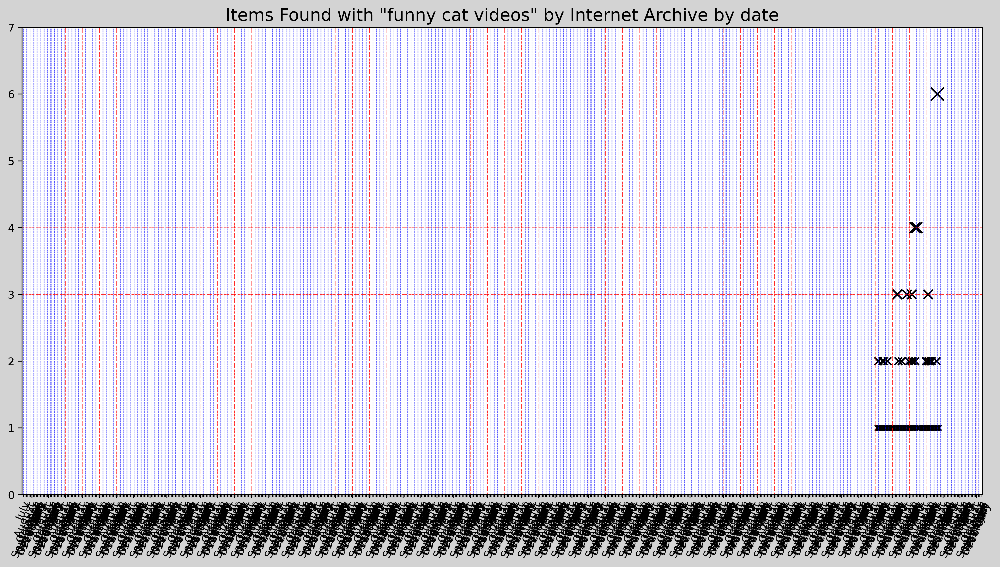

In [37]:
x = df1.index

y = df1['Count']

fig= plt.figure(figsize=(16, 8), dpi=400,facecolor='lightgray')
ax=plt.subplot()
plt.gca().xaxis.set_minor_formatter(mdates.DateFormatter('%B'))
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
plt.gca().tick_params(axis="x", which="both", rotation=67)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y/%b'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.scatter(x,y,s=y*25,marker='x',color='k')
plt.gca().grid(which='major', color='r', linestyle='-.', linewidth=.3, alpha=1)  
plt.gca().grid(which='minor', color='b', linestyle='-.', linewidth=.2,alpha=.7)
plt.ylim(top=7,bottom=0)
plt.title('Items Found with "funny cat videos" by Internet Archive by date',size=16)
df2 = df1.reset_index(drop=True)
x2 = df2.index
y2 = df2['Count']
m, b = np.polyfit(x2, y2, 1)
plt.plot([df1.index[0],1.19],[df1.index[len(df1.index)],len(df1.index)*.00163238)
plt.close()

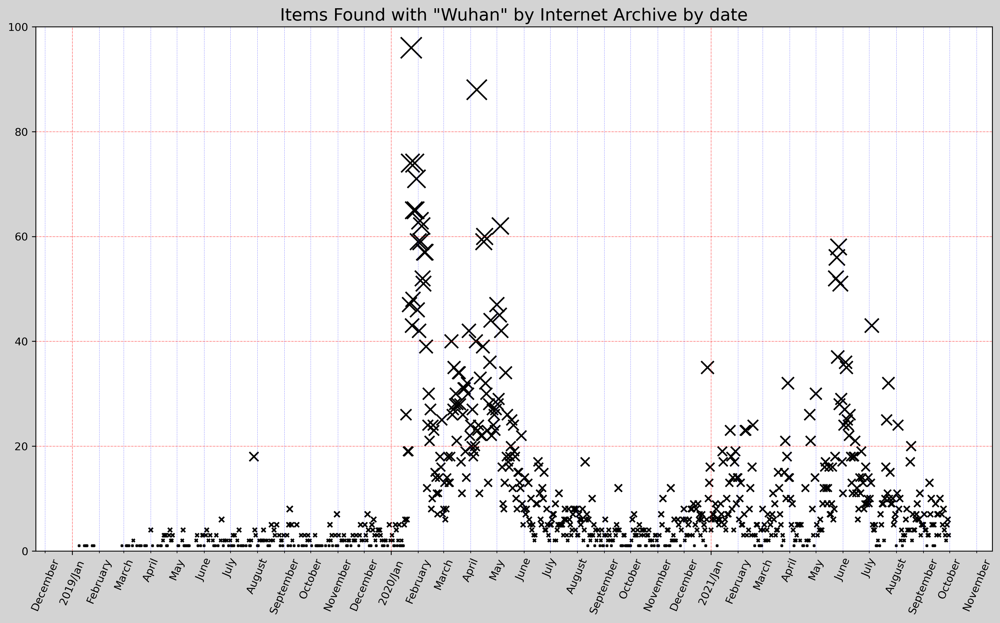

In [1108]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
from celluloid import Camera

fig = plt.figure(figsize=(16, 9), dpi=300,facecolor='lightgray')
ax=  fig.gca()
ax.xaxis.set_minor_formatter(mdates.DateFormatter('%B'))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.tick_params(axis="x", which="both", rotation=67)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y/%b'))
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.grid(which='major', color='r', linestyle='-.', linewidth=.3, alpha=1)  
ax.grid(which='minor', color='b', linestyle='-.', linewidth=.2,alpha=.7)
ax.set_ylim(top=100,bottom=0)

plt.title('Items Found with "Wuhan" by Internet Archive by date',size=16)

rows = []
a = 0
camera = Camera(fig)
for i,row in df1.iterrows():
    rows=df1[:i]
    ax.scatter(rows['Count'].index,rows['Count'],s=rows['Count']*4,marker='x',color='k')
    camera.snap()

anim = camera.animate(blit=False)

anim.save('scatter.gif',fps=60)

plt.show()
plt.close()